# 緯度経度による震源データのクラスタリング

In [1]:
import numpy as np
import pandas as pd
import plotly.express as px
from epicenters import load_training_data
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

## データ読み込み

学習用データを今回のクラスタリング対象にする。  

In [2]:
df_train = load_training_data("config.yml")

In [3]:
df_train.head()

,id,time,latitude,longitude,depth,magnitude1,magnitude1_type,magnitude2,magnitude2_type,travel_time_type,...,epicenter_information,max_seismic,damage,tsunami,region1,region2,epicenter_name,observation_point,epicenter_decision,year
0,A19190101121537,1919-01-01 12:15:37,34.233333,135.166667,0.0,NaN,None,NaN,None,NaN,...,NaN,1,None,None,NaN,NaN,詳細不明,1,N,1919
1,A19190102184743,1919-01-02 18:47:43,38.433333,141.300000,0.0,NaN,None,NaN,None,NaN,...,NaN,1,None,None,NaN,NaN,詳細不明,1,N,1919
2,A19190103020006,1919-01-03 02:00:06,42.983333,144.383333,0.0,NaN,None,NaN,None,NaN,...,NaN,1,None,None,NaN,NaN,詳細不明,1,N,1919
3,A19190103093201,1919-01-03 09:32:01,32.733333,129.866667,0.0,NaN,None,NaN,None,NaN,...,NaN,1,None,None,NaN,NaN,詳細不明,1,N,1919
4,A19190104182025,1919-01-04 18:20:25,41.705556,144.505278,15.0,5.2,J,NaN,None,5.0,...,1.0,4,None,None,1.0,28.0,十勝沖,3,K,1919


In [4]:
df_locations = df_train[["id", "time", "latitude", "longitude"]]
df_locations.head()

,id,time,latitude,longitude
0,A19190101121537,1919-01-01 12:15:37,34.233333,135.166667
1,A19190102184743,1919-01-02 18:47:43,38.433333,141.300000
2,A19190103020006,1919-01-03 02:00:06,42.983333,144.383333
3,A19190103093201,1919-01-03 09:32:01,32.733333,129.866667
4,A19190104182025,1919-01-04 18:20:25,41.705556,144.505278


In [5]:
df_locations.agg(("min", "max"))

,id,time,latitude,longitude
min,A19190101121537,1919-01-01 12:15:37,15.218333,118.816667
max,A20091231180307,2009-12-31 18:03:07,54.205000,160.751667


クラスタリングするため、緯度経度を標準化しておく。

In [6]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_locations[["latitude", "longitude"]].to_numpy())

## KMeansのクラスター数を決定する

エルボー法でクラスター数を決定する。

In [7]:
CLUSTER_NUM_LIST = [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]

In [8]:
inertia_list = []
for n_clusters in CLUSTER_NUM_LIST:
    kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(X_scaled)
    inertia_list.append(kmeans.inertia_)

<AxesSubplot:xlabel='n_clusters'>

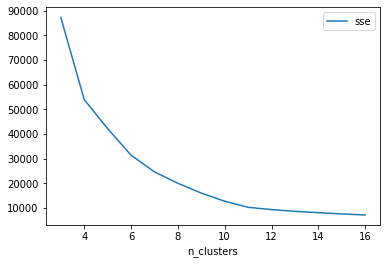

In [9]:
df_sse = pd.DataFrame(data={"n_clusters": CLUSTER_NUM_LIST, "sse": inertia_list})
df_sse.plot(x="n_clusters", y="sse")

11以降の変動が少なくなるため、クラスター数は11を採用する。

In [10]:
OPTIMAL_CLUSTER_NUM = 11

In [11]:
kmeans = KMeans(n_clusters=OPTIMAL_CLUSTER_NUM, random_state=0).fit(X_scaled)

後でクラスターの中心同士で距離を計算して特徴量に使えるようにしたい。

In [12]:
cluster_centers = scaler.inverse_transform(kmeans.cluster_centers_)
cluster_centers

array([[ 36.28088905, 140.44114621],
       [ 28.09422844, 129.27525667],
       [ 42.11303465, 141.68537459],
       [ 32.6228431 , 130.83823351],
       [ 36.55472503, 138.1646795 ],
       [ 24.45111695, 123.90579445],
       [ 34.36615228, 139.31958548],
       [ 34.61430252, 134.87776066],
       [ 39.2412718 , 141.58636672],
       [ 43.24919554, 145.77893712],
       [ 27.9449414 , 141.4658343 ]])

In [13]:
df_cluster_centers = pd.DataFrame(
    cluster_centers, columns=["cluster_center_lat", "cluster_center_lon"]
)
df_cluster_centers.index.name = "cluster_id"
df_cluster_centers.reset_index(inplace=True)
df_cluster_centers

,cluster_id,cluster_center_lat,cluster_center_lon
0,0,36.280889,140.441146
1,1,28.094228,129.275257
2,2,42.113035,141.685375
3,3,32.622843,130.838234
4,4,36.554725,138.164679
5,5,24.451117,123.905794
6,6,34.366152,139.319585
7,7,34.614303,134.877761
8,8,39.241272,141.586367
9,9,43.249196,145.778937


クラスタリングした結果を元のデータに付与する。

In [14]:
df_clustered = df_locations.assign(cluster_id=kmeans.labels_).merge(
    df_cluster_centers, how="left", on=["cluster_id"]
)
df_clustered.head()

,id,time,latitude,longitude,cluster_id,cluster_center_lat,cluster_center_lon
0,A19190101121537,1919-01-01 12:15:37,34.233333,135.166667,7,34.614303,134.877761
1,A19190102184743,1919-01-02 18:47:43,38.433333,141.300000,8,39.241272,141.586367
2,A19190103020006,1919-01-03 02:00:06,42.983333,144.383333,9,43.249196,145.778937
3,A19190103093201,1919-01-03 09:32:01,32.733333,129.866667,3,32.622843,130.838234
4,A19190104182025,1919-01-04 18:20:25,41.705556,144.505278,9,43.249196,145.778937


## クラスタリング結果を可視化

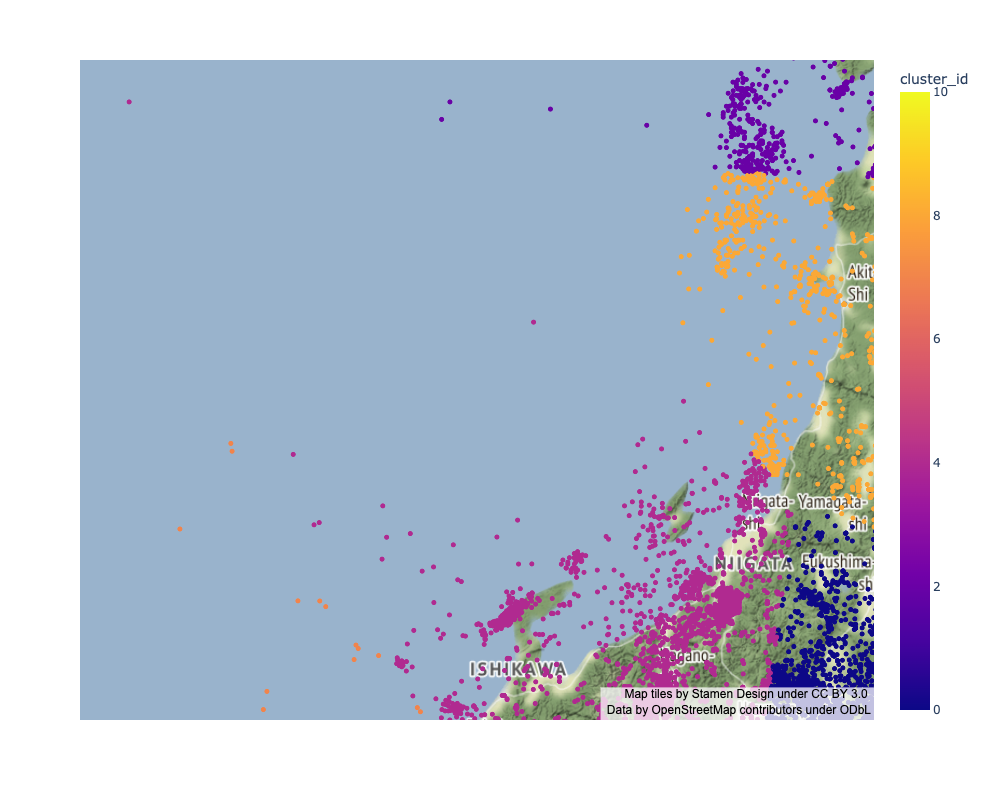

In [15]:
fig = px.scatter_mapbox(
    df_clustered,
    lat="latitude",
    lon="longitude",
    color="cluster_id",
    center=dict(lat=35, lon=139),
    zoom=5,
    width=880,
    height=800,
    mapbox_style="stamen-terrain",
)
fig.show()

クラスターの中心をプロット

In [16]:
df_cluster_centers

,cluster_id,cluster_center_lat,cluster_center_lon
0,0,36.280889,140.441146
1,1,28.094228,129.275257
2,2,42.113035,141.685375
3,3,32.622843,130.838234
4,4,36.554725,138.164679
5,5,24.451117,123.905794
6,6,34.366152,139.319585
7,7,34.614303,134.877761
8,8,39.241272,141.586367
9,9,43.249196,145.778937


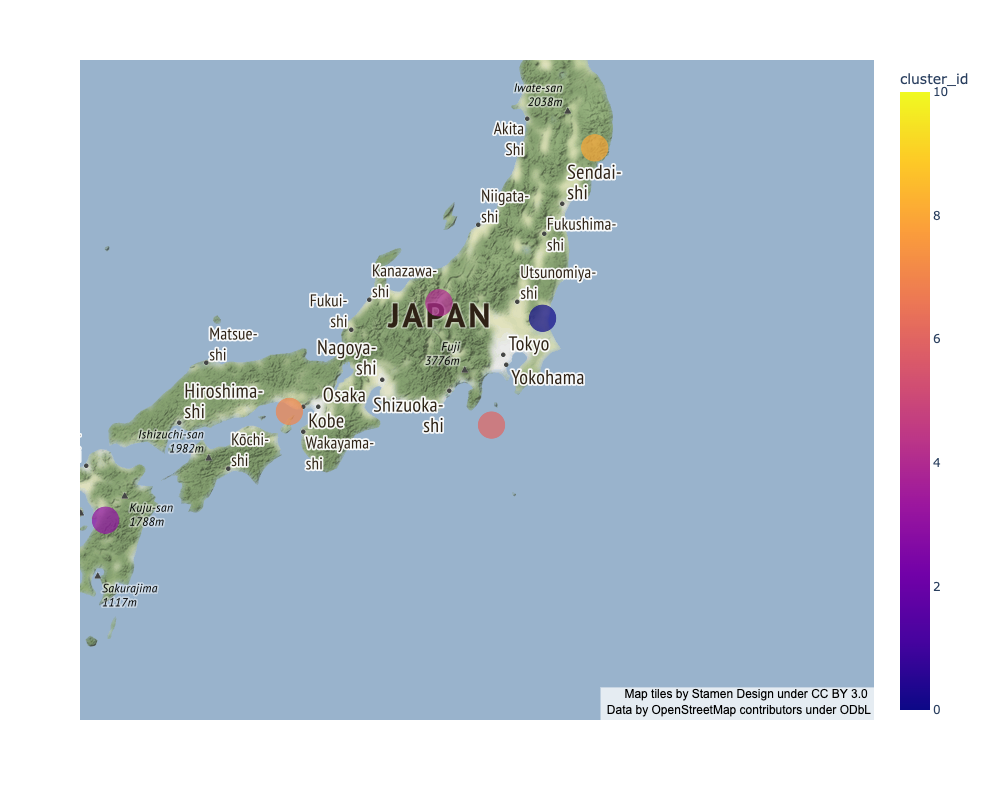

In [17]:
fig = px.scatter_mapbox(
    df_cluster_centers,
    lat="cluster_center_lat",
    lon="cluster_center_lon",
    color="cluster_id",
    center=dict(lat=35, lon=139),
    size=np.array([1] * df_cluster_centers.shape[0]),
    zoom=5,
    width=880,
    height=800,
    mapbox_style="stamen-terrain",
)
fig.show()

クラスターIDを北海道から九州・沖縄に向かって整列させた方が分かりやすいので、クラスターIDを付け替える。  
また、同時に各クラスターがどの地域を表しているのかを目で確認して、ラベルとして付与する。

In [18]:
cluster_label_map = {
    "0": "茨城県中部 茨城町",
    "1": "鹿児島県 奄美大島",
    "2": "北海道道南 日高沖",
    "3": "熊本県中部 下益城群",
    "4": "長野県北部 千曲市",
    "5": "沖縄県西表島 北東",
    "6": "東京都 新島",
    "7": "兵庫県南部 瀬戸内海",
    "8": "岩手県南東 気仙群",
    "9": "北海道道東 根室沖",
    "10": "東京都小笠原諸島 北西",
}

cluster_id_convert_map = {
    "0": 4,
    "1": 9,
    "2": 2,
    "3": 8,
    "4": 6,
    "5": 11,
    "6": 5,
    "7": 7,
    "8": 3,
    "9": 1,
    "10": 10,
}

In [20]:
old_cluster_id = df_cluster_centers.cluster_id.astype("str")
df_cluster_centers_revised = df_cluster_centers.assign(
    cluster_id=old_cluster_id.map(lambda id_: cluster_id_convert_map[id_]),
    cluster_label=old_cluster_id.map(lambda id_: cluster_label_map[id_]),
)
df_cluster_centers_revised.sort_values(by=["cluster_id"], inplace=True)
df_cluster_centers_revised

,cluster_id,cluster_center_lat,cluster_center_lon,cluster_label
9,1,43.249196,145.778937,北海道道東 根室沖
2,2,42.113035,141.685375,北海道道南 日高沖
8,3,39.241272,141.586367,岩手県南東 気仙群
0,4,36.280889,140.441146,茨城県中部 茨城町
6,5,34.366152,139.319585,東京都 新島
4,6,36.554725,138.164679,長野県北部 千曲市
7,7,34.614303,134.877761,兵庫県南部 瀬戸内海
3,8,32.622843,130.838234,熊本県中部 下益城群
1,9,28.094228,129.275257,鹿児島県 奄美大島
10,10,27.944941,141.465834,東京都小笠原諸島 北西


クラスターIDを付け替えた結果をプロットする。  
北海道から九州・沖縄に向けて整列している事が確認できた。

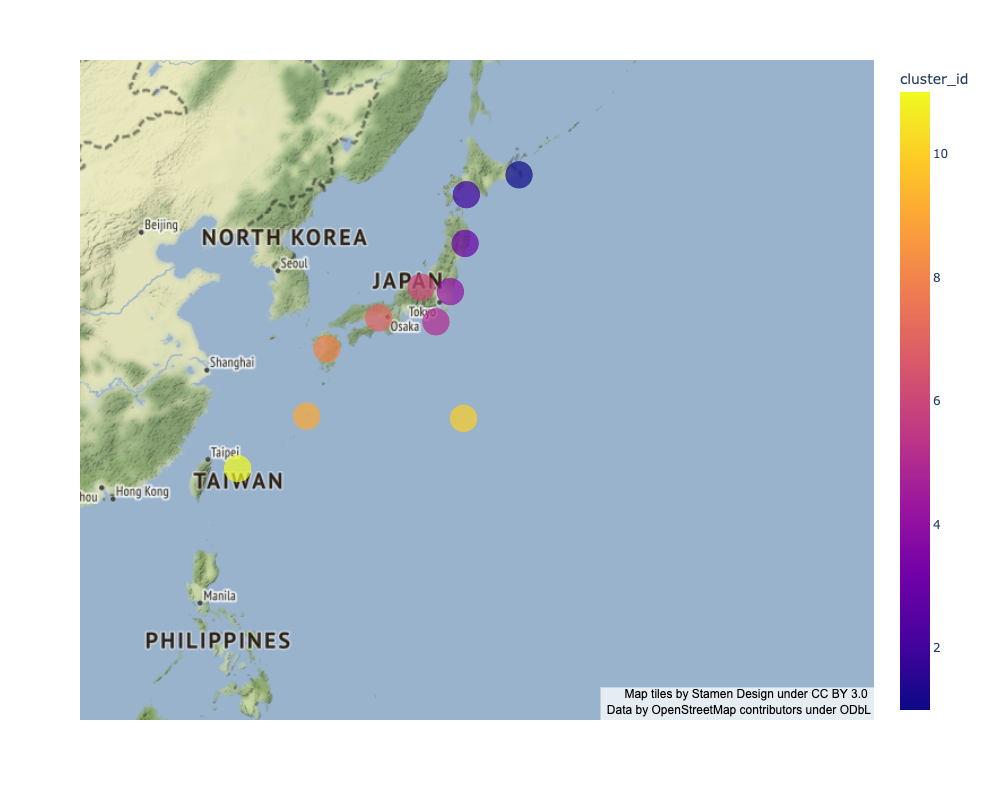

In [21]:
fig = px.scatter_mapbox(
    df_cluster_centers_revised,
    lat="cluster_center_lat",
    lon="cluster_center_lon",
    color="cluster_id",
    center=dict(lat=35, lon=139),
    size=np.array([1] * df_cluster_centers.shape[0]),
    zoom=5,
    width=880,
    height=800,
    mapbox_style="stamen-terrain",
)
fig.show()